# Mounting Google Cloud on Google Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


# Installing Pytorch

In [ ]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.6.0+cu101)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.7.0+cu101)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-dh9pg4iy
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-dh9pg4iy
  Created wheel for fvcore: filename=fvcore-0.1.2-cp36-none-any.whl size=47854 sha256=bfed94da2dcbe7526d4041e9a5dc4371cf5ccf10b769557a7e96f22c8701d8df
  Stored in directory: /tmp/pip-ephem-wheel-cache-36v9e17d/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
Successfully built fvcore


# Installing Detectron2 (The Next Generation Object )

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

fatal: destination path 'detectron2_repo' already exists and is not an empty directory.
Obtaining file:///content/detectron2_repo
  Found existing installation: detectron2 0.2.1
    Can't uninstall 'detectron2'. No files were found to uninstall.
  Running setup.py develop for detectron2


In [ ]:
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# Some basic setup:
# Setup detectron2 logger


# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("cheetos1", {}, "./drive/My Drive/data/output.json", "./drive/My Drive/data/images")

AssertionError: ignored

In [ ]:
from detectron2.data import MetadataCatalog
cheetos_metadata = MetadataCatalog.get("cheetos1")

In [ ]:
dataset_dicts = DatasetCatalog.get("cheetos1")


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



# Visualize the Annotated Dataset

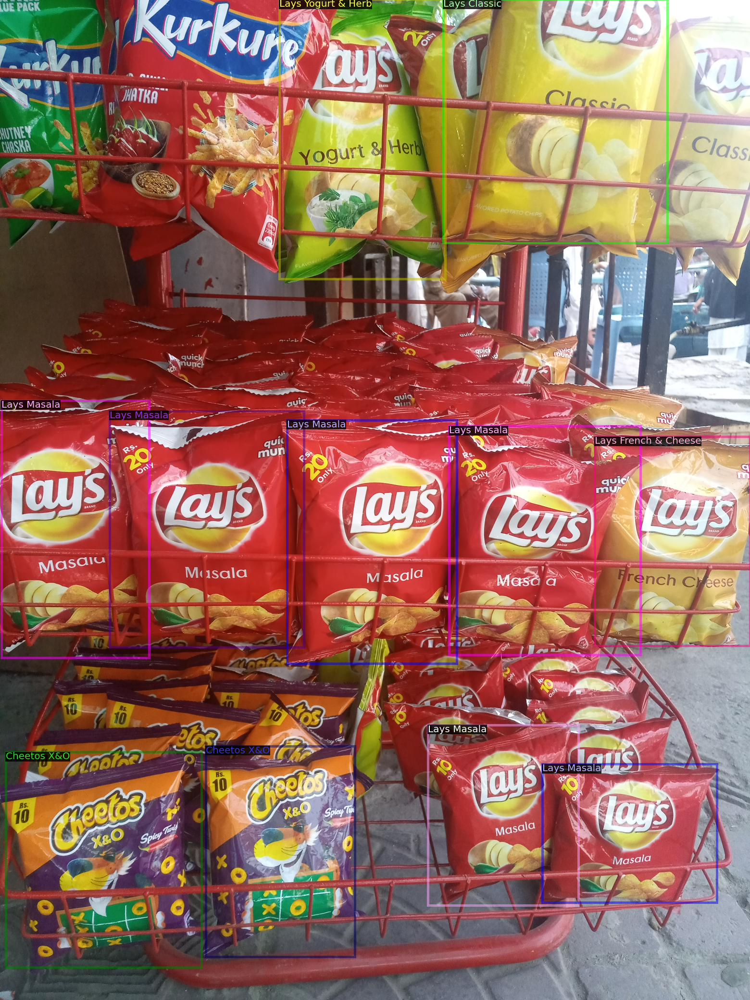

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cheetos_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Writing the Detectron2 Configurations

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()

cfg.merge_from_file("./detectron2_repo/configs/COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("cheetos1",)
cfg.DATASETS.TEST = ()
cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-101.pkl" # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 11

cfg.TEST.EVAL_PERIOD = 500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[09/28 12:56:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

# Register COCO Test Dataset

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("cheetostest", {}, "./drive/My Drive/data_test/output_test.json", "./drive/My Drive/data_test/images")

In [ ]:
from detectron2.data import MetadataCatalog
cheetos_metadata_test = MetadataCatalog.get("cheetostest")

In [ ]:
cheetos_dicts_test = DatasetCatalog.get("cheetostest")

WARNING [09/28 13:53:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/28 13:53:22 d2.data.datasets.coco]: Loaded 45 images in COCO format from ./drive/My Drive/data_test/output_test.json


# Train the Model

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("cheetostest", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "cheetostest")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [09/28 13:53:29 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/28 13:53:29 d2.data.datasets.coco]: Loaded 45 images in COCO format from ./drive/My Drive/data_test/output_test.json
[09/28 13:53:29 d2.data.build]: Distribution of instances among all 11 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
| Cheetos Bites | 30           | Cheetos Fla.. | 84           | Cheetos Oce.. | 41           |
| Cheetos Puffs | 15           |  Cheetos X&O  | 8            | Lays Classic  | 71           |
| Lays French.. | 82           |  Lays Masala  | 97           | Lays Paprika  | 81           |
|   Lays Wavy   | 37           | Lays Yogurt.. | 84           |               |              |
|     total     | 630          |               |              |               |         

# Prediction on Test Data

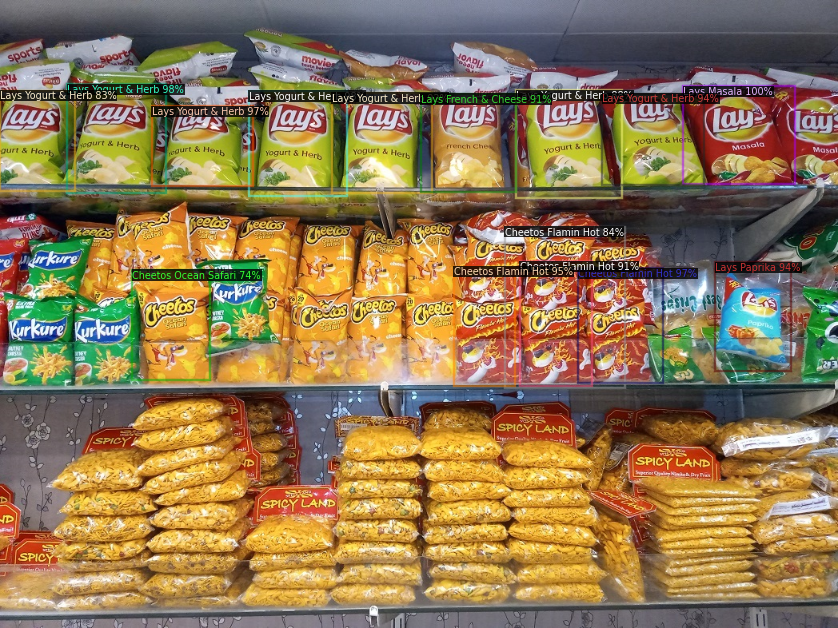

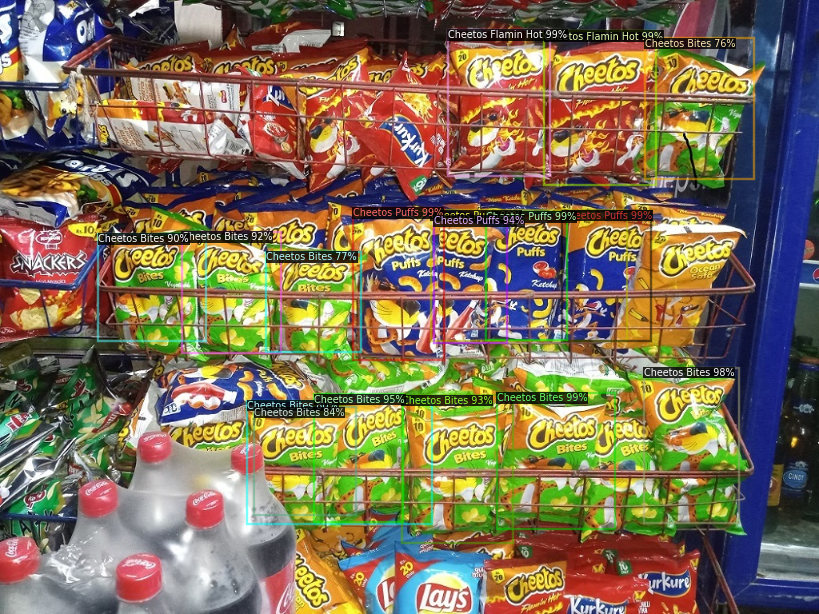

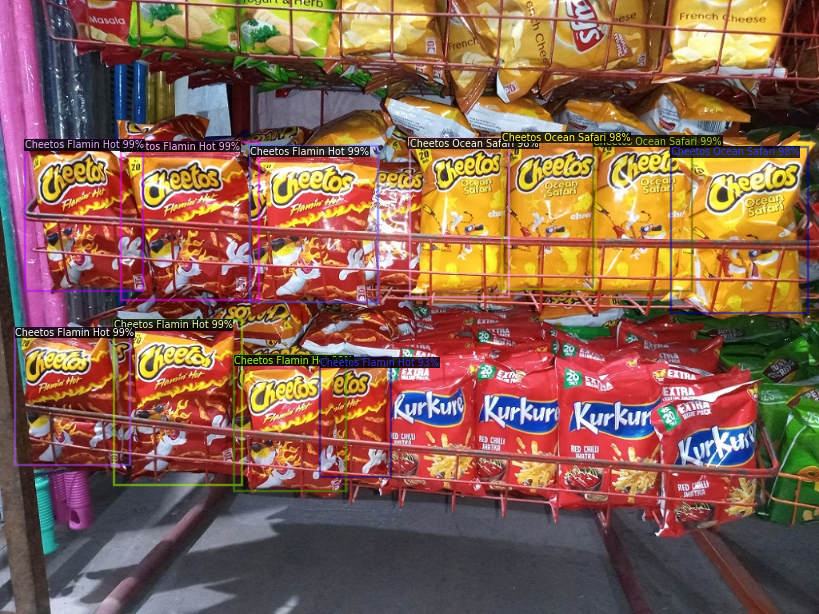

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
#cfg.DATASETS.TEST = ("ariel_datatest", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
#ariel_test_metadata = MetadataCatalog.get("ariel_datatest")

from detectron2.utils.visualizer import ColorMode

imgs_path="/content/drive/My Drive/data1/img"
num_imgs=3
for img in os.listdir(imgs_path)[:num_imgs]:
  im=cv2.imread(os.path.join(imgs_path,img))
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=cheetos_metadata_test,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

# Generating the facts of prediction on test data dataset

In [ ]:
import pandas as pd
imgs_path="/content/drive/My Drive/data1/img" #give path of your test images folder
num_imgs=10 #number of images you wana get predictions on
metadata=cheetos_metadata_test #put your matadata varibale here
data=[]
for img in os.listdir(imgs_path)[:num_imgs]:
    im=cv2.imread(os.path.join(imgs_path,img))
    outputs=predictor(im)
    boxes = [i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_boxes]
    classes=[i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_classes]
    scores =[i.cpu().detach().numpy().astype('float32').tolist() for i in outputs["instances"].scores]
    height=outputs["instances"].image_size[0]
    width=outputs["instances"].image_size[1]
    name=img
    for i in range(len(boxes)):
      box = boxes[i]
      x1=box[0]
      y1=box[1]
      x2=box[2]
      y2=box[3]
      score=scores[i]
      class_id=classes[i]
      pred_class=metadata.thing_classes[class_id]
      data.append({"Img_path":name,
                   "Height":height,
                   "Width":width,
                   "X1":x1,
                   "Y1":y1,
                   "X2":x2,
                   "Y2":y2,
                   "Predicted Class":pred_class,
                   "Confidence Level":score})

# Converting the data list of prediction test in a DataFrame

In [ ]:
dataframe=pd.DataFrame(data)

# Print the Data Frqme

In [ ]:
dataframe

,Img_path,Height,Width,X1,Y1,X2,Y2,Predicted Class,Confidence Level
0,1.jpg,786,1048,853,109,993,231,Lays Masala,0.995164
1,1.jpg,786,1048,84,107,206,242,Lays Yogurt & Herb,0.979058
2,1.jpg,786,1048,310,115,434,247,Lays Yogurt & Herb,0.977404
3,1.jpg,786,1048,189,134,315,233,Lays Yogurt & Herb,0.967532
4,1.jpg,786,1048,722,336,828,480,Cheetos Flamin Hot,0.967356
...,...,...,...,...,...,...,...,...,...
101,16.jpg,1365,1024,150,457,358,689,Lays Paprika,0.861702
102,16.jpg,1365,1024,401,993,520,1162,Lays Wavy,0.804713
103,16.jpg,1365,1024,338,500,491,681,Lays Masala,0.784398
104,16.jpg,1365,1024,106,734,313,920,Lays French & Cheese,0.751232
